# Initial Setup

## Installing all required libraries

In [2]:
!pip install pandas
!pip install numpy
!pip install datasets
!pip install text2emotion
!pip install textblob
!pip install spacy
!pip install sentence-transformers
!pip install matplotlib
!pip install wordcloud
!pip install seaborn
# !pip install -U typing-extensions
# pip install cython
# pip install tokenizers-0.10.3
!pip install networkx

# Need to use older version of emoji as the new one has breaking changes
!pip uninstall emoji -y
!pip install emoji==1.7.0

  Using cached seaborn-0.12.1-py3-none-any.whl (288 kB)
Found existing installation: emoji 1.7.0
Uninstalling emoji-1.7.0:
  Successfully uninstalled emoji-1.7.0
  Using cached emoji-1.7.0-py3-none-any.whl


## Importing all the required Libraries

In [76]:
from datasets import load_dataset, Dataset, DatasetDict
import numpy as np
import pandas as pd
import pandas as pd
import numpy as np

#for plotting images & adjusting colors
import matplotlib.pyplot as plt
import matplotlib as mpl
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/deveshsurve/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

## Loading and Creating the dataset

In [77]:
datasets = load_dataset("huggingartists/dua-lipa")

Found cached dataset dua-lipa (/Users/deveshsurve/.cache/huggingface/datasets/huggingartists___dua-lipa/default/1.0.0/ebf0799aab5ed80bd11eb847f5f8ec2ca801478aa1f41838ada6d5b7d5545042)
100%|██████████| 1/1 [00:00<00:00, 75.58it/s]


## Applying basic preprocessing

- Clean and recreate the dataset:
- Remove special characters
- Substitute multiple spaces with single spaces
- Convert to lower case

In [4]:
"""
Clean and recreate the dataset:
a. Remove special characters
b. Substitute multiple spaces with single spaces
c. Convert to lower case
"""

import re
def eda(sentences):
    processed_sentences = []

    for s in sentences:
        # Remove all the special characters
        processed_sentence = re.sub(r'\W', ' ', str(s))

        # Substituting multiple spaces with single space
        processed_sentence = re.sub(r'\s+', ' ', processed_sentence, flags=re.I)
        
        # Converting to Lowercase
        processed_sentence = processed_sentence.lower()

        processed_sentences.append(processed_sentence)
        
    return processed_sentences

song_data = eda(datasets['train']['text'])
print("Length of song_data :", len(song_data))
lyric_data = eda([item for sublist in [i.split('\n') for i in datasets['train']['text']] for item in sublist])
print("Length of lyric_data :", len(lyric_data))

Length of song_data : 454
Length of lyric_data : 20713


## Checking and removing any empty values 

In [5]:
import numpy as np
song_data = [song_data[i] for i in range(len(song_data)) if len(song_data[i]) > 5]
print("Length of song_data :", len(song_data))
lyric_data = [lyric_data[i] for i in range(len(lyric_data)) if len(lyric_data[i]) > 1]
print("Length of lyric_data :", len(lyric_data))

Length of song_data : 408
Length of lyric_data : 20641


## Converting all lyrics to pandas dataframe
- Here, we consider all song lines as individual rows 

In [6]:
all_dua_lyrics = pd.DataFrame([item for sublist in [i.split('\n') for i in lyric_data] for item in sublist])
all_dua_lyrics.columns = ["Line_Lyrics"]
all_dua_lyrics.head(5)

,Line_Lyrics
0,one one one one one
1,talkin in my sleep at night makin myself crazy
2,wrote it down and read it out hopin it would s...
3,my love he makes me feel like nobody else nobo...
4,but my love he doesnt love me so i tell myself...


## Converting all songs to pandas dataframe
- Here, we consider all songs as individual rows 

In [7]:
all_dua_songs = pd.DataFrame(song_data)
all_dua_songs.columns = ["Song_Lyrics"]
all_dua_songs.head(5)

,Song_Lyrics
0,one one one one one talkin in my sleep at nigh...
1,it was great at the very start hands on each o...
2,if you dont wanna see me did a full one eighty...
3,you call me all friendly tellin me how much yo...
4,one kiss is all it takes fallin in love with m...


## Saving both the dataframes

In [8]:
all_dua_songs.to_csv("all_dua_songs.csv")
all_dua_lyrics.to_csv("all_dua_lyrics.csv")

# Analysis 1 : Finding the emotions of Dua Lipa Song Lyrics 
- Here, we make use of the following libraries
    - NLTK for Sentiment Intensity Analyser
    - Text2Emotion
    - TextBlob

In [9]:
# Download NLTK dependency
import nltk
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/deveshsurve/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [10]:
# Getting list of emotions for every song 
# import text2emotion as te
# from tqdm import tqdm

# emotions = []
# for cleaned_song in tqdm(all_dua_songs.values):
#     emotions.append(te.get_emotion(cleaned_song[0]))

# Note : Commmenting this as it takes time and I have saved the dataframe it makes

In [11]:
# Converting the same into a dataframe
# emotions_df = pd.DataFrame(emotions)
# emotions_df.head()

# Note : Commmenting this as it takes time and I have saved the dataframe it makes

In [12]:
# joining with master df
# all_dua_songs_emotion = all_dua_songs.join(emotions_df)
# all_dua_songs_emotion.head(5)

# Note : Commmenting this as it takes time and I have saved the dataframe it makes

In [13]:
# saving the dataframe
# all_dua_songs_emotion.to_csv("all_dua_songs_emotion.csv")

# Note : Commmenting this as it takes time and I have saved the dataframe it makes

In [14]:
all_dua_songs_emotion = pd.read_csv("all_dua_songs_emotion.csv", index_col=0)
all_dua_songs_emotion.head(5)

,Song_Lyrics,Happy,Angry,Surprise,Sad,Fear
0,one one one one one talkin in my sleep at nigh...,0.29,0.00,0.07,0.10,0.54
1,it was great at the very start hands on each o...,0.02,0.04,0.26,0.66,0.02
2,if you dont wanna see me did a full one eighty...,0.00,0.25,0.00,0.53,0.22
3,you call me all friendly tellin me how much yo...,0.31,0.07,0.07,0.29,0.27
4,one kiss is all it takes fallin in love with m...,0.36,0.04,0.36,0.25,0.00


In [15]:
text = all_dua_songs_emotion['Song_Lyrics'].tolist()
text = ' '.join(text).lower()

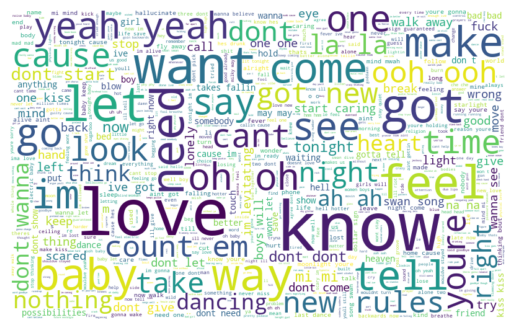

In [16]:
#creating a wordcloud of all words
wordcloud = WordCloud(width=800, height=500, max_font_size=110, background_color="white", max_words=3000, 
                      contour_width=3, contour_color='steelblue',stopwords = STOPWORDS,
                      collocations=True).generate(text)
#plot the wordcloud object
plt.imshow(wordcloud, interpolation='bilInear')
plt.axis('off')
plt.show()

In [17]:
#Define your list of columns
cols = ['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']
# calculating sum of values
emo_sum = dict(all_dua_songs_emotion[cols].sum(axis=0))
emo_sum

{'Happy': 66.09,
 'Angry': 36.19,
 'Surprise': 74.19999999999999,
 'Sad': 128.51,
 'Fear': 91.88}

In [18]:
# Standardizing the values for base 100
emo_sum_dict = {key:(value*100)/len(all_dua_songs_emotion) for key,value in emo_sum.items()}
emo_sum_dict

{'Happy': 16.198529411764707,
 'Angry': 8.870098039215685,
 'Surprise': 18.18627450980392,
 'Sad': 31.497549019607842,
 'Fear': 22.519607843137255}

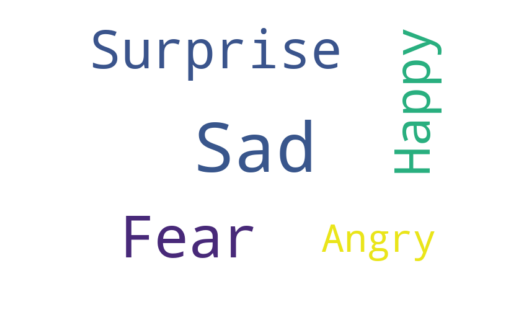

In [19]:
#creating a wordcloud of all emotions
wordcloud.generate_from_frequencies(emo_sum_dict)
plt.imshow(wordcloud, interpolation='bilInear')
plt.axis('off')
plt.show()

In [20]:
sid = SentimentIntensityAnalyzer()
all_dua_songs_emotion = all_dua_songs_emotion.join(pd.json_normalize(all_dua_songs_emotion["Song_Lyrics"].apply(sid.polarity_scores)))
all_dua_songs_emotion = all_dua_songs_emotion.rename(columns={"neg": "Negative Valence", "pos": "Positive Valence", "neu": "Neutral Valence", "compound": "Compound"})
all_dua_songs_emotion.head(5)

,Song_Lyrics,Happy,Angry,Surprise,Sad,Fear,Negative Valence,Neutral Valence,Positive Valence,Compound
0,one one one one one talkin in my sleep at nigh...,0.29,0.00,0.07,0.10,0.54,0.095,0.828,0.077,-0.4393
1,it was great at the very start hands on each o...,0.02,0.04,0.26,0.66,0.02,0.230,0.703,0.067,-0.9947
2,if you dont wanna see me did a full one eighty...,0.00,0.25,0.00,0.53,0.22,0.146,0.818,0.036,-0.9870
3,you call me all friendly tellin me how much yo...,0.31,0.07,0.07,0.29,0.27,0.149,0.665,0.186,0.9767
4,one kiss is all it takes fallin in love with m...,0.36,0.04,0.36,0.25,0.00,0.019,0.707,0.274,0.9980


In [21]:
from textblob import TextBlob
all_dua_songs_emotion = all_dua_songs_emotion.join(pd.json_normalize(all_dua_songs_emotion["Song_Lyrics"].apply(lambda x: { "Subjectivity" : TextBlob(x).sentiment.subjectivity, "Polarity" : TextBlob(x).sentiment.polarity })))
all_dua_songs_emotion.head(5)

,Song_Lyrics,Happy,Angry,Surprise,Sad,Fear,Negative Valence,Neutral Valence,Positive Valence,Compound,Subjectivity,Polarity
0,one one one one one talkin in my sleep at nigh...,0.29,0.00,0.07,0.10,0.54,0.095,0.828,0.077,-0.4393,0.651192,0.098869
1,it was great at the very start hands on each o...,0.02,0.04,0.26,0.66,0.02,0.230,0.703,0.067,-0.9947,0.642742,0.057258
2,if you dont wanna see me did a full one eighty...,0.00,0.25,0.00,0.53,0.22,0.146,0.818,0.036,-0.9870,0.502273,0.047727
3,you call me all friendly tellin me how much yo...,0.31,0.07,0.07,0.29,0.27,0.149,0.665,0.186,0.9767,0.607143,-0.087143
4,one kiss is all it takes fallin in love with m...,0.36,0.04,0.36,0.25,0.00,0.019,0.707,0.274,0.9980,0.625000,0.466667


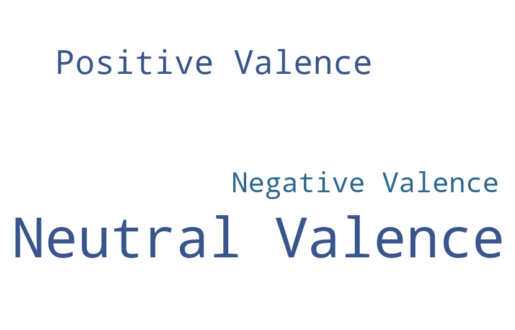

In [22]:
#Define your list of columns
cols = ["Negative Valence", "Neutral Valence", "Positive Valence"]
# calculating sum of values
emo_sum_2 = dict(all_dua_songs_emotion[cols].sum(axis=0))

#creating a wordcloud of all emotions
wordcloud.generate_from_frequencies(emo_sum_2)
plt.imshow(wordcloud, interpolation='bilInear')
plt.axis('off')
plt.show()

In [23]:
# saving to csv 
all_dua_songs_emotion.to_csv("all_dua_songs_emotion_2.csv")

# Analysis 2: Network Model - Page Rank ##

In [24]:
from sentence_transformers import SentenceTransformer

In [25]:
bmodel = SentenceTransformer('all-MiniLM-L6-v2') #384 dims

In [26]:
bert_embeddings = bmodel.encode(all_dua_songs_emotion["Song_Lyrics"])
bert_embeddings.shape

(408, 384)

In [27]:
#Print the embeddings
for i, (sentence, embedding) in enumerate(zip(all_dua_songs_emotion["Song_Lyrics"], bert_embeddings)):
    print("Sentence:", sentence)
    print("Embedding:", embedding)
    print("")
    if i == 3: break

Sentence: one one one one one talkin in my sleep at night makin myself crazy wrote it down and read it out hopin it would save me my love he makes me feel like nobody else nobody else but my love he doesnt love me so i tell myself i tell myself one dont pick up the phone you know hes only callin cause hes drunk and alone two dont let him in youll have to kick him out again three dont be his friend you know youre gonna wake up in his bed in the morning and if youre under him you aint gettin over him i got new rules i count em i got new rules i count em i gotta tell them to myself i got new rules i count em i gotta tell them to myself i keep pushin forwards but he keeps pullin me backwards now im standin back from it i finally see the pattern but my love he doesnt love me so i tell myself i tell myself i do i do i do one dont pick up the phone you know hes only callin cause hes drunk and alone two dont let him in youll have to kick him out again three dont be his friend you know youre go

In [28]:
# Computing cosine similarity between all the vectors
import numpy as np
a = bert_embeddings[0]
b = bert_embeddings[1]
cos_sim = (a @ b.T) / (np.linalg.norm(a)*np.linalg.norm(b))
cos_sim

0.39961377

In [29]:
from tqdm import tqdm
M = np.eye(408)
for i,a in tqdm(enumerate(bert_embeddings)):
    for j,b in enumerate(bert_embeddings):
        if i != j:
            M[i,j] = (a @ b.T) / (np.linalg.norm(a)*np.linalg.norm(b))
M

408it [00:01, 342.69it/s]


array([[1.        , 0.39961377, 0.50849825, ..., 0.51575631, 0.42180297,
        0.45639366],
       [0.39961377, 1.        , 0.50583273, ..., 0.51319611, 0.44668928,
        0.48545626],
       [0.50849825, 0.50583273, 1.        , ..., 0.99323136, 0.60637259,
        0.55415195],
       ...,
       [0.51575631, 0.51319611, 0.99323136, ..., 1.        , 0.60787743,
        0.5544042 ],
       [0.42180297, 0.44668928, 0.60637259, ..., 0.60787743, 1.        ,
        0.54365319],
       [0.45639366, 0.48545626, 0.55415195, ..., 0.5544042 , 0.54365319,
        1.        ]])

In [30]:
import networkx
similarity_graph = networkx.from_numpy_array(M)
similarity_graph

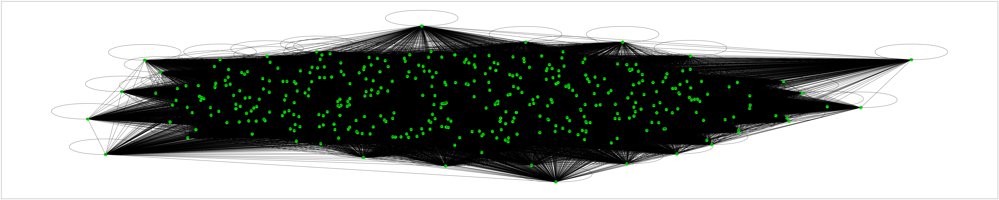

In [31]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(100, 20))
networkx.draw_networkx(similarity_graph, node_color='lime')

In [32]:
# !pip install scipy==1.8.0

In [33]:
scores = networkx.pagerank(similarity_graph)
nx_ranked_sentences = sorted(((score, index, all_dua_songs_emotion["Song_Lyrics"][index]) 
                              for index, score in scores.items()), 
                          reverse=True)
nx_ranked_sentences[:10]

[(0.002908320351216305,
  167,
  'are you ready one kiss is all it takes fallin in love with me possibilities i look like all you need one kiss is all it takes fallin in love with me possibilities i look like all you need let me take the night i love real easy and i know that youll still wanna see me on the sunday morning music real loud let me love you while the moon is still out something in you lit up heaven in me the feeling wont let me sleep cause im lost in the way you move the way you feel one kiss is all it takes fallin in love with me possibilities i look like all you need one kiss is all it takes fallin in love with me possibilities i look like all you need i look like all you need i look like all you need baby girl yuh a carry ten ton a phatness gimme some a dat mixed wid the badness look how she hot shaped like goddess but a nah jus dat good piece a mentals under di cap hot piece of frame an mi love how yuh trod watching every step a di pepper deh whe yuh got stayin in ma b

## Variation 2: For individual song lyrics 

In [34]:
all_dua_lyrics = pd.read_csv("all_dua_lyrics.csv", index_col=0)
all_dua_lyrics.head()

,Line_Lyrics
0,one one one one one
1,talkin in my sleep at night makin myself crazy
2,wrote it down and read it out hopin it would s...
3,my love he makes me feel like nobody else nobo...
4,but my love he doesnt love me so i tell myself...


In [35]:
from sentence_transformers import SentenceTransformer

In [36]:
bmodel = SentenceTransformer('all-MiniLM-L6-v2') #384 dims

In [37]:
# bert_embeddings = bmodel.encode(all_dua_lyrics["Line_Lyrics"])
# bert_embeddings.shape

In [38]:
# #Print the embeddings
# for i, (sentence, embedding) in enumerate(zip(all_dua_lyrics["Line_Lyrics"], bert_embeddings)):
#     print("Sentence:", sentence)
#     print("Embedding:", embedding)
#     print("")
#     if i == 3: break

In [39]:
# # Computing cosine similarity between all the vectors
# import numpy as np
# a = bert_embeddings[0]
# b = bert_embeddings[1]
# cos_sim = (a @ b.T) / (np.linalg.norm(a)*np.linalg.norm(b))
# cos_sim

In [40]:
# from tqdm import tqdm
# M = np.eye(20641)
# for i,a in tqdm(enumerate(bert_embeddings)):
#     for j,b in enumerate(bert_embeddings):
#         if i != j:
#             M[i,j] = (a @ b.T) / (np.linalg.norm(a)*np.linalg.norm(b))
# M

In [41]:
# np.savetxt('cosin_sim.csv', M, delimiter=',')

In [42]:
# import networkx
# similarity_graph = networkx.from_numpy_array(M)
# similarity_graph

In [43]:
# import matplotlib.pyplot as plt
# %matplotlib inline

# plt.figure(figsize=(100, 20))
# networkx.draw_networkx(similarity_graph, node_color='lime')

In [44]:
# scores = networkx.pagerank(similarity_graph)
# nx_ranked_sentences = sorted(((score, index, all_dua_lyrics["Line_Lyrics"][index]) 
#                               for index, score in scores.items()), 
#                           reverse=True)
# nx_ranked_sentences[:10]

### Now why is this incorrect ? 
- *Well, When we create a BERT Model embedding, it gets trained on contextual data, hence single lines of lyrics ( which by the way results in 10.8 GB data file ), thus its better to work with entire songs.*

# Analysis 3: Computational Model using PyMC3 ##

In [45]:
all_dua_lyrics['NumWords'] = all_dua_lyrics['Line_Lyrics'].apply(lambda x: len(x.split()))
all_dua_lyrics.head(5)

,Line_Lyrics,NumWords
0,one one one one one,5
1,talkin in my sleep at night makin myself crazy,9
2,wrote it down and read it out hopin it would s...,12
3,my love he makes me feel like nobody else nobo...,11
4,but my love he doesnt love me so i tell myself...,14


Text(0.5, 1.0, 'Distribution of number of words in each sentence')

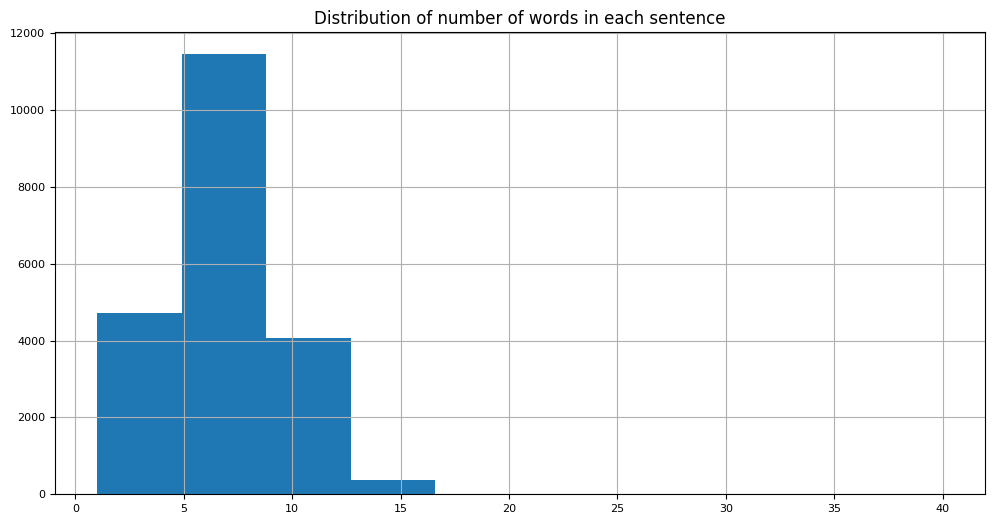

In [46]:
all_dua_lyrics[['NumWords']].hist(figsize=(12, 6), bins=10, xlabelsize=8, ylabelsize=8);
plt.title("Distribution of number of words in each sentence")

In [47]:
all_words = ''.join([word for word in all_dua_lyrics['Line_Lyrics']]).replace('\n', ' ')
all_words[0:1000]

'one one one one onetalkin in my sleep at night makin myself crazywrote it down and read it out hopin it would save memy love he makes me feel like nobody else nobody elsebut my love he doesnt love me so i tell myself i tell myselfone dont pick up the phoneyou know hes only callin cause hes drunk and alonetwo dont let him inyoull have to kick him out againthree dont be his friendyou know youre gonna wake up in his bed in the morningand if youre under him you aint gettin over himi got new rules i count emi got new rules i count emi gotta tell them to myselfi got new rules i count emi gotta tell them to myselfi keep pushin forwards but he keeps pullin me backwardsnow im standin back from it i finally see the patternbut my love he doesnt love me so i tell myself i tell myselfi do i do i doone dont pick up the phoneyou know hes only callin cause hes drunk and alonetwo dont let him inyoull have to kick him out againthree dont be his friendyou know youre gonna wake up in his bed in the morni

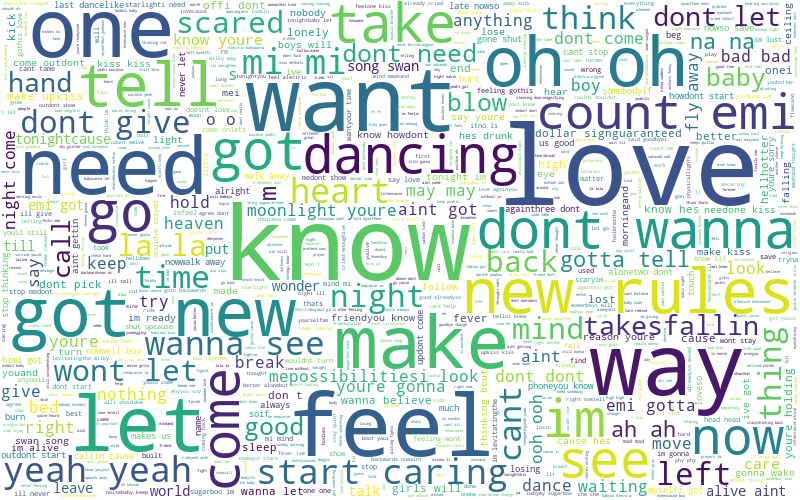

In [48]:
from wordcloud import WordCloud

# Create a WordCloud object
wordcloud = WordCloud(width=800, height=500, max_font_size=110, background_color="white", max_words=3000, contour_width=3, contour_color='steelblue')

# Generate a word cloud
wordcloud.generate(all_words)

# Visualize the word cloud
wordcloud.to_image()

In [49]:
import re
NON_ALPHANUM = re.compile(r'[\W]')
NON_ASCII = re.compile(r'[^a-z0-1\s]')
def normalize_texts(texts):
    normalized_texts = ''
    lower = texts.lower()
    no_punctuation = NON_ALPHANUM.sub(r' ', lower)
    no_non_ascii = NON_ASCII.sub(r'', no_punctuation)
    return no_non_ascii
  
all_dua_lyrics['Normalize_Lyrics'] = all_dua_lyrics['Line_Lyrics'].apply(normalize_texts)
all_dua_lyrics.head()

,Line_Lyrics,NumWords,Normalize_Lyrics
0,one one one one one,5,one one one one one
1,talkin in my sleep at night makin myself crazy,9,talkin in my sleep at night makin myself crazy
2,wrote it down and read it out hopin it would s...,12,wrote it down and read it out hopin it would s...
3,my love he makes me feel like nobody else nobo...,11,my love he makes me feel like nobody else nobo...
4,but my love he doesnt love me so i tell myself...,14,but my love he doesnt love me so i tell myself...


In [50]:
all_dua_lyrics['Normalize_Lyrics'] = all_dua_lyrics['Normalize_Lyrics'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>2]))
all_dua_lyrics.head()

,Line_Lyrics,NumWords,Normalize_Lyrics
0,one one one one one,5,one one one one one
1,talkin in my sleep at night makin myself crazy,9,talkin sleep night makin myself crazy
2,wrote it down and read it out hopin it would s...,12,wrote down and read out hopin would save
3,my love he makes me feel like nobody else nobo...,11,love makes feel like nobody else nobody else
4,but my love he doesnt love me so i tell myself...,14,but love doesnt love tell myself tell myself


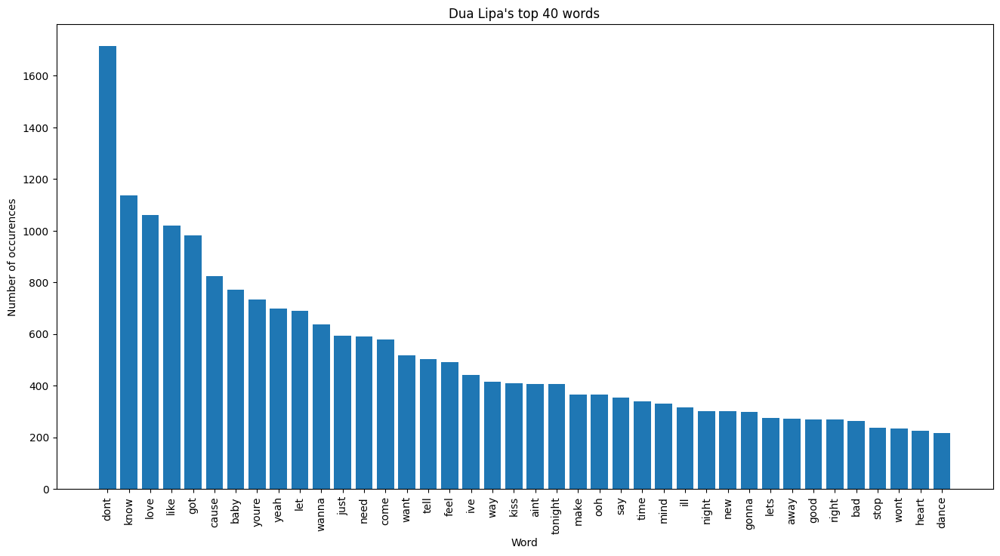

In [51]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

def get_top_n_words(corpus, n=10):
    vec = CountVectorizer(stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in   vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

words = []
word_values = []
for i,j in get_top_n_words(all_dua_lyrics['Normalize_Lyrics'], 40):
    words.append(i)
    word_values.append(j)
fig, ax = plt.subplots(figsize=(16,8))
ax.bar(range(len(words)), word_values);
ax.set_xticks(range(len(words)));
ax.set_xticklabels(words, rotation='vertical');
ax.set_title("Dua Lipa's top 40 words");
ax.set_xlabel('Word');
ax.set_ylabel('Number of occurences');
plt.show()

In [52]:
all_dua_lyrics.to_csv("all_dua_lyrics_2.csv")

In [5]:
all_dua_lyrics = pd.read_csv("all_dua_lyrics_2.csv", index_col=0)
all_dua_lyrics.head()

,Line_Lyrics,NumWords,Normalize_Lyrics
0,one one one one one,5,one one one one one
1,talkin in my sleep at night makin myself crazy,9,talkin sleep night makin myself crazy
2,wrote it down and read it out hopin it would s...,12,wrote down and read out hopin would save
3,my love he makes me feel like nobody else nobo...,11,love makes feel like nobody else nobody else
4,but my love he doesnt love me so i tell myself...,14,but love doesnt love tell myself tell myself


In [6]:
import spacy

# Process `text` with Spacy NLP Parser
text = '. '.join(all_dua_lyrics["Line_Lyrics"])
text

/Users/deveshsurve/opt/anaconda3/envs/test1/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


'one one one one one. talkin in my sleep at night makin myself crazy. wrote it down and read it out hopin it would save me. my love he makes me feel like nobody else nobody else. but my love he doesnt love me so i tell myself i tell myself. one dont pick up the phone. you know hes only callin cause hes drunk and alone. two dont let him in. youll have to kick him out again. three dont be his friend. you know youre gonna wake up in his bed in the morning. and if youre under him you aint gettin over him. i got new rules i count em. i got new rules i count em. i gotta tell them to myself. i got new rules i count em. i gotta tell them to myself. i keep pushin forwards but he keeps pullin me backwards. now im standin back from it i finally see the pattern. but my love he doesnt love me so i tell myself i tell myself. i do i do i do. one dont pick up the phone. you know hes only callin cause hes drunk and alone. two dont let him in. youll have to kick him out again. three dont be his friend. 

In [7]:
!python3 -m spacy download en_core_web_sm

# nlp = spacy.load('en')
nlp = spacy.load("en_core_web_sm")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 27.2 MB/s eta 0:00:0000:0100:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [8]:
processed_text = nlp(text)

In [9]:
# dir(processed_text)

In [10]:
# How many sentences are in the the text
sentences = [s for s in processed_text.sents]
print(len(sentences))

# Print sentences from index 10 to index 15, to make sure that we have parsed it correctly
print(sentences[10:15])

21859
[three dont be his friend., you know youre gonna wake up in his bed in the morning., and if youre under him you aint gettin over him., i got new rules i count em., i got new rules i count em.]


In [11]:
# processed_text

In [12]:
# Extract all the personal names and count their occurrences. 
# Expected output is a list in the following form: [('xxx', 622), ('yyy', 312), ('zzz', 286), ...].

from collections import Counter, defaultdict

def find_character_occurences(doc):
    """
    Return a list of actors from `doc` with corresponding occurences.
    
    :param doc: Spacy NLP parsed document
    :return: list of tuples in form
        [('xxx', 622), ('yyy', 312), ('zzz', 286), ...]
    """
    
    label = Counter()
    characters = Counter()
    cardinal = Counter()
    time = Counter()
    date = Counter()
    org = Counter()
    norp = Counter()
    for ent in doc.ents:
        label[ent.label_] += 1
        if ent.label_ == 'PERSON':
            characters[ent.lemma_] += 1
        elif ent.label_ == 'CARDINAL':
            cardinal[ent.lemma_] += 1
        elif ent.label_ == 'TIME':
            time[ent.lemma_] += 1
        elif ent.label_ == 'DATE':
            date[ent.lemma_] += 1
        elif ent.label_ == 'ORG':
            org[ent.lemma_] += 1
        elif ent.label_ == 'NORP':
            norp[ent.lemma_] += 1
    print(label)
    print()
    print(characters.most_common())
    print()
    print(cardinal.most_common())
    print()
    print(time.most_common())
    print()
    print(date.most_common())
    print()
    print(org.most_common())
    print()
    print(norp.most_common())
    print()
    return characters.most_common()

print(find_character_occurences(processed_text)[:20])

Counter({'PERSON': 1167, 'CARDINAL': 818, 'TIME': 703, 'DATE': 259, 'ORG': 237, 'NORP': 170, 'GPE': 122, 'ORDINAL': 53, 'QUANTITY': 13, 'LOC': 7, 'PERCENT': 3, 'MONEY': 1, 'PRODUCT': 1})

[('wanna', 214), ('li', 64), ('don', 43), ('la la', 24), ('ya', 21), ('song swan', 18), ('standin', 15), ('holdin nothin', 15), ('aaah aah aah', 15), ('bang bang', 13), ('god', 13), ('yeux ça', 12), ('la voix', 12), ('hella hella', 12), ('souvent c quand je pense', 11), ('mad mad', 11), ('lightin', 11), ('le yeux oui ça', 10), ('mon cœur se serre', 10), ('head head', 10), ('swan song', 10), ('ill', 10), ('livin', 10), ('song swan dive', 10), ('tu', 9), ('wanna sin', 9), ('kinda', 9), ('ça partira', 8), ('lo', 8), ('imma', 8), ('mari bercinta', 8), ('karmas', 7), ('la la la la', 7), ('dom dom kurşunu', 7), ('y esta noche', 7), ('importa un carajo', 7), ('bang', 6), ('moi je suis rien', 6), ('swear', 6), ('dua lipa', 6), ('bonsam', 6), ('دارم میتونی', 6), ('stupida elettricità', 6), ('à toi', 6), ('star

In [13]:
# Plot characters' mentions as a time series relative to the position of the actor's occurrence in a book.

def get_character_offsets(doc):
    """
    For every character in a `doc` collect all the occurences offsets and store them into a list. 
    The function returns a dictionary that has actor lemma as a key and list of occurences as a value for every character.
    
    :param doc: Spacy NLP parsed document
    :return: dict object in form
        [('xxx', 622), ('yyy', 312), ('zzz', 286), ...]
    """
    
    character_offsets = defaultdict(list)
    for ent in doc.ents:
        if ent.label_ == 'TIME':
            character_offsets[ent.lemma_].append(ent.start)
            
    return dict(character_offsets)

character_occurences = get_character_offsets(processed_text)

In [14]:
print(list(character_occurences.keys()))

['night', 'the morning', 'tonight', 'the night', 'morning', 'late in the night', 'all morning', 'all night', 'midnight', 'every single night', 'all night all night', 'skintight', 'all the minute the second', 'a minute', 'last night', 'every night', 'the last night', 'second', 'the extra hour', 'hour', 'a night', 'a night like a night like a night', 'another minute', 'evening', 'midnight midnight', 'late at night', 'میکنی', 'an hour', 'this night', 'two hundred hour', 'this morning', 'late last night', 'one night', 'minute']


In [15]:
[x for x in list(character_occurences.keys()) if any([x.startswith(y) for y in ['night', 'morning']])]

['night', 'morning']

In [16]:
# list(doc.noun_chunks)

In [17]:
# Extract Keywords using noun chunks from the news article (file 'article.txt').
# Spacy will pick some noun chunks that are not informative at all (e.g. we, what, who).
# Try to find a way to remove non informative keywords.

#article = read_file('data/article.txt')
#doc = nlp(article)
doc = processed_text

keywords = Counter()
for chunk in doc.noun_chunks:
    if nlp.vocab[chunk.lemma_].prob < - 8: # probablity value -8 is arbitrarily selected threshold
        keywords[chunk.lemma_] += 1

# keywords.most_common(20)
keywords

Counter({'talkin': 17,
         'my sleep': 20,
         'night makin': 16,
         'myself': 329,
         'it': 1982,
         'I': 11592,
         'he': 549,
         'nobody': 76,
         'one': 52,
         'the phone': 53,
         'you': 6983,
         'only callin': 39,
         'his friend': 95,
         'his bed': 48,
         'the morning': 55,
         'new rule': 188,
         'em': 229,
         'they': 315,
         'pullin': 19,
         'the pattern': 18,
         'practice': 12,
         'tryna': 63,
         'heart': 16,
         'sleep': 33,
         'gettin': 10,
         'the very start': 12,
         'hand': 31,
         'fight': 13,
         'slamming door': 24,
         'all our flaw': 24,
         'we': 1355,
         'just our body': 27,
         'our mind': 26,
         'the only reason': 52,
         'cause': 76,
         'somebody': 165,
         'track': 13,
         'touch': 12,
         'all the mess up fight': 12,
         'its': 67,
         'its wr

In [18]:
list(np.array([1,2,3]))

[1, 2, 3]

In [19]:
# character_occurences

['night', 'morning']
['night', 'morning']


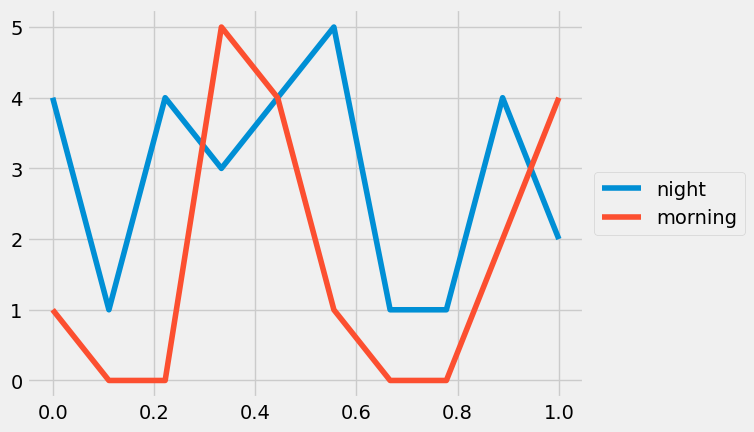

In [20]:
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pyplot import hist
from cycler import cycler

NUM_BINS = 10

def normalize(occurencies, normalization_constant):
    return [o / float(len(processed_text)) for o in occurencies]

def plot_character_timeseries(character_offsets, character_labels, normalization_constant=None):
    """
    Plot characters' personal names specified in `character_labels` list as time series.
    
    :param character_offsets: dict object in form {'xxx': [123, 543, 4534], 'yyy': [205, 2111]}
    :param character_labels: list of strings that should match some of the keys in `character_offsets`
    :param normalization_constant: int
    """ 
    x = [character_offsets[character_label] for character_label in character_labels] 
    with plt.style.context('fivethirtyeight'):
        plt.figure()
        n, bins, patches = plt.hist(x, NUM_BINS, label=character_labels)
        plt.clf()
        ax = plt.subplot(111)
        for i, a in enumerate(n):
            print(character_labels)
            ax.plot([float(x) / (NUM_BINS - 1) for x in range(len(a))], a, label=character_labels[int(i)])
            
        plt.rcParams['axes.prop_cycle'] = cycler(color=['r','k','c','b','y','m','g','#54a1FF'])
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

#plot_character_timeseries(character_occurences, ['darcy', 'bingley'], normalization_constant=len(processed_text))
plot_character_timeseries(character_occurences, ['night', 'morning'])

In [21]:
dua_paragraphs = list(pd.read_csv("all_dua_songs.csv", index_col=0).values.flatten())

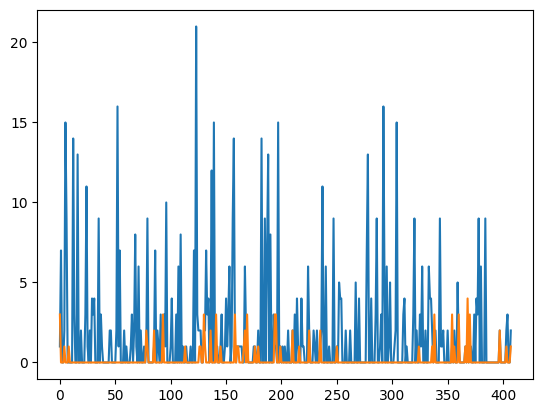

In [22]:
def get_words_paragraphs(paragraphs, words):
    
    word_para = defaultdict(list)
    for p in dua_paragraphs:
        for w in words:
            word_para[w].append(p.count(w))
            
    return dict(word_para)

morning_night_occurences = get_words_paragraphs(dua_paragraphs, ['night', 'morning'])
night_occurences = [v for k,v in morning_night_occurences.items() if k == 'night'][0]
morning_occurences = [v for k,v in morning_night_occurences.items() if k == 'morning'][0]
plt.plot(night_occurences)
plt.plot(morning_occurences)

In [23]:
positive_words = []
with open("pos_words.txt", "r") as input:
    pair_lines = input.read().split(",")
pair_lines[:10]
for p in pair_lines:
    positive_words.append(p.split('\t')[0])
print(positive_words[:10])

['absolutely', 'accepted', 'acclaimed', 'accomplish', 'accomplishment', 'achievement', 'action', 'active', 'admire', 'adorable']


100%|██████████| 408/408 [00:00<00:00, 2988.99it/s]


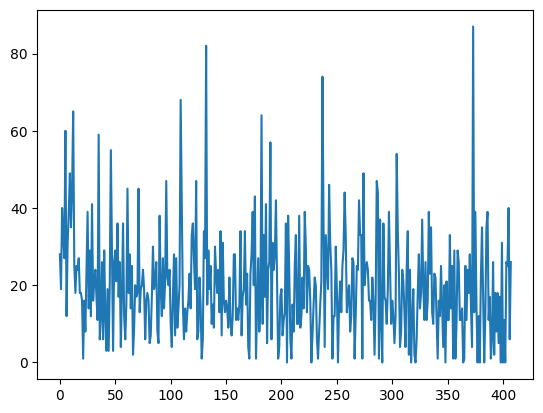

In [24]:
from tqdm import tqdm
def get_any_words_paragraphs(paragraphs, words):
    
    word_para = []
    for p in tqdm(paragraphs):
        total = 0
        for w in words:
            total += p.count(w)
        word_para.append(total)
            
    return word_para

positive_occurences = get_any_words_paragraphs(dua_paragraphs, positive_words)
plt.plot(positive_occurences)

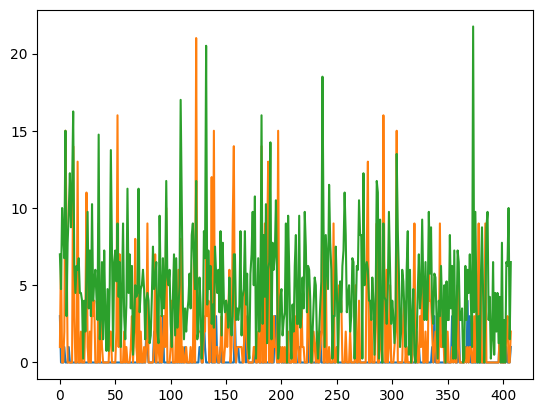

In [25]:
plt.plot(morning_occurences)
plt.plot(night_occurences)
plt.plot([m / 4 for m in  positive_occurences])

In [26]:
bool_morning_occurences = [bool(v) for v in morning_occurences]
bool_night_occurences = [bool(v) for v in night_occurences]

In [27]:
df_pos = pd.DataFrame(list(zip(positive_occurences, morning_occurences, night_occurences)), 
                        columns =['positive', 'morning', 'night'])
df_pos

,positive,morning,night
0,28,3,1
1,19,0,7
2,40,0,0
3,33,0,0
4,27,1,2
...,...,...,...
403,26,1,2
404,25,0,3
405,40,0,0
406,6,0,0


In [28]:
df_pos.to_csv("df_pos.csv")

## Creating a negative binomial model

In [29]:
!pip uninstall scipy -y
# !pip uninstall pymc3 -y
!pip install pymc3
# !pip install scipy==1.7.4
# NOTE : Please Restart Kernel at this point if needed as scipy 1.8.0 / 1.7.3 version change may not be reflected

Found existing installation: scipy 1.7.3
Uninstalling scipy-1.7.3:
  Successfully uninstalled scipy-1.7.3
  Using cached scipy-1.7.3-cp310-cp310-macosx_10_9_x86_64.whl (33.2 MB)


In [30]:
df_pos = pd.read_csv("df_pos.csv", index_col=0)

In [31]:
import numpy as np
import pandas as pd
import pymc3 as pm
from scipy import stats
from scipy import optimize
import matplotlib.pyplot as plt
import seaborn as sns
import re

%matplotlib inline

In [32]:
fml = 'positive ~ morning + night + morning:night'

with pm.Model() as model:
    pm.glm.GLM.from_formula(formula=fml, data=df_pos, family=pm.glm.families.NegativeBinomial())
    trace = pm.sample(4000, cores=2)

The glm module is deprecated and will be removed in version 4.0
We recommend to instead use Bambi https://bambinos.github.io/bambi/
/Users/deveshsurve/opt/anaconda3/envs/test1/lib/python3.10/site-packages/deprecat/classic.py:215: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  return wrapped_(*args_, **kwargs_)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [alpha, mu, morning:night, night, morning, Intercept]


Sampling 2 chains for 1_000 tune and 4_000 draw iterations (2_000 + 8_000 draws total) took 51 seconds.


In [33]:
def plot_traces(trcs, varnames=None):
    '''Plot traces with overlaid means and values'''

    nrows = len(trcs.varnames)
    if varnames is not None:
        nrows = len(varnames)

    ax = pm.traceplot(trcs, var_names=varnames, figsize=(12,nrows*1.4),
                      lines={k: v['mean'] for k, v in
                             pm.summary(trcs,var_names=varnames).iterrows()})

    for i, mn in enumerate(pm.summary(trcs, var_names=varnames)['mean']):
        ax[i,0].annotate('{:.2f}'.format(mn), xy=(mn,0), xycoords='data',
                         xytext=(5,10), textcoords='offset points', rotation=90,
                         va='bottom', fontsize='large', color='#AA0022')

def strip_derived_rvs(rvs):
    '''Remove PyMC3-generated RVs from a list'''

    ret_rvs = []
    for rv in rvs:
        if not (re.search('_log',rv.name) or re.search('_interval',rv.name)):
            ret_rvs.append(rv)
    return ret_rvs

In [34]:
rvs = [rv.name for rv in strip_derived_rvs(model.unobserved_RVs)]
rvs

['Intercept', 'morning', 'night', 'morning:night', 'mu', 'alpha']

Got error No model on context stack. trying to find log_likelihood in translation.
/Users/deveshsurve/opt/anaconda3/envs/test1/lib/python3.10/site-packages/arviz/data/io_pymc3_3x.py:98: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(
/var/folders/qm/2m60vf_d5z3b2hf93l6yznfr0000gn/T/ipykernel_10554/3456475131.py:8: DeprecationWarning: The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.
  ax = pm.traceplot(trcs, var_names=varnames, figsize=(12,nrows*1.4),
Got error No model on context stack. trying to find log_likelihood in translation.
/Users/deveshsurve/opt/anaconda3/envs/test1/lib/python3.10/site-packages/arviz/data/io_pymc3_3x.py:98: FutureWarning: Using `from_pymc3` without the model wil

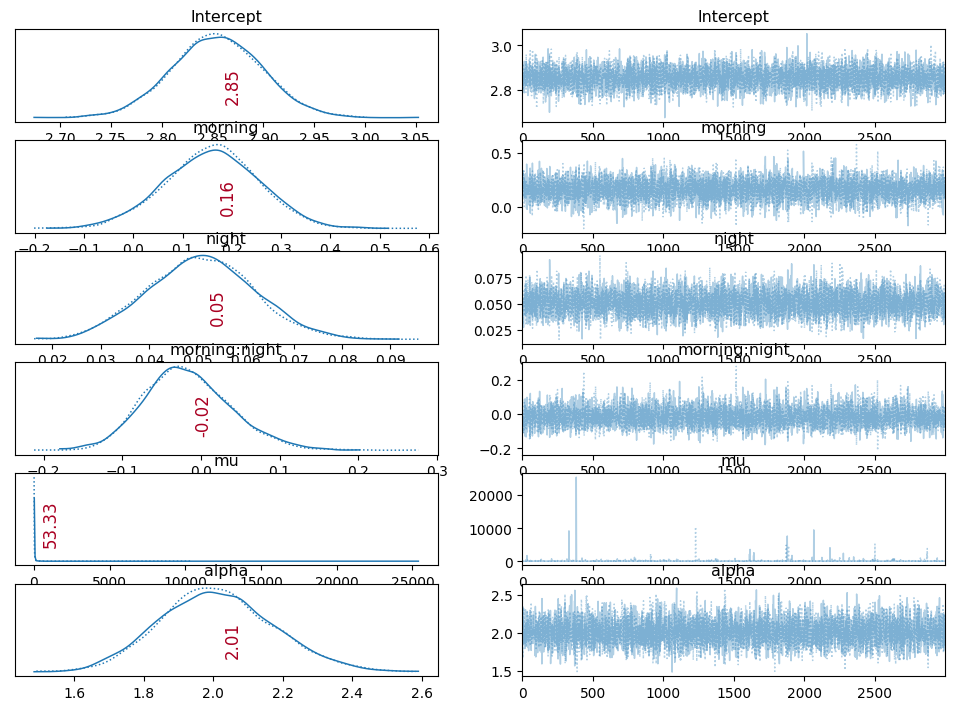

In [35]:
plot_traces(trace[1000:], varnames=rvs);

# Analysis 4 : Semantic Modelling using LDA

In [53]:
!pip install gensim pyLDAvis

  Using cached pyLDAvis-3.3.1-py2.py3-none-any.whl
  Using cached numexpr-2.8.4-cp310-cp310-macosx_10_9_x86_64.whl (99 kB)
  Using cached future-0.18.2-py3-none-any.whl
  Using cached sklearn-0.0.post1-py3-none-any.whl
  Using cached funcy-1.17-py2.py3-none-any.whl (33 kB)


In [54]:
# Gensim
import gensim
import gensim.corpora as corpora
import pandas as pd
import numpy as np
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
     
# spacy for lemmatization
import spacy

In [55]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

In [56]:
all_dua_lyrics = pd.read_csv("all_dua_lyrics_2.csv", index_col=0)
all_dua_lyrics.head(5)

,Line_Lyrics,NumWords,Normalize_Lyrics
0,one one one one one,5,one one one one one
1,talkin in my sleep at night makin myself crazy,9,talkin sleep night makin myself crazy
2,wrote it down and read it out hopin it would s...,12,wrote down and read out hopin would save
3,my love he makes me feel like nobody else nobo...,11,love makes feel like nobody else nobody else
4,but my love he doesnt love me so i tell myself...,14,but love doesnt love tell myself tell myself


In [57]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

# dua_words = list(sent_to_words(list(all_dua_lyrics["Normalize_Lyrics"].values)))
dua_words = list(sent_to_words(list(all_dua_lyrics["Normalize_Lyrics"].values.flatten())))
dua_words[:5]


[['one', 'one', 'one', 'one', 'one'],
 ['talkin', 'sleep', 'night', 'makin', 'myself', 'crazy'],
 ['wrote', 'down', 'and', 'read', 'out', 'hopin', 'would', 'save'],
 ['love', 'makes', 'feel', 'like', 'nobody', 'else', 'nobody', 'else'],
 ['but', 'love', 'doesnt', 'love', 'tell', 'myself', 'tell', 'myself']]

In [58]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(dua_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[dua_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[dua_words[0]]])

['one', 'one', 'one', 'one', 'one']


In [59]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [60]:
# Remove Stop Words
dua_words_nostops = remove_stopwords(dua_words)

# Form Bigrams
dua_words_bigrams = make_bigrams(dua_words_nostops)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
dua_lemmatized = lemmatization(dua_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(dua_lemmatized[:1])

[[]]


In [61]:
# Create Dictionary
id2word = corpora.Dictionary(dua_lemmatized)

# Create Corpus
texts = dua_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[]]


In [62]:
id2word[0]

'crazy'

In [63]:
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[]]

In [64]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [65]:
from pprint import pprint

# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.652*"know" + 0.201*"wrong" + 0.066*"even" + 0.000*"number" + 0.000*"away" '
  '+ 0.000*"ve" + 0.000*"walk" + 0.000*"end" + 0.000*"want" + '
  '0.000*"remember"'),
 (1,
  '0.423*"care" + 0.365*"start" + 0.003*"great" + 0.000*"think" + 0.000*"nice" '
  '+ 0.000*"finish" + 0.000*"girl" + 0.000*"dream" + 0.000*"say" + '
  '0.000*"blood"'),
 (2,
  '0.877*"come" + 0.000*"show" + 0.000*"way" + 0.000*"easy" + 0.000*"fade" + '
  '0.000*"shit" + 0.000*"physical" + 0.000*"phy" + 0.000*"dawn" + '
  '0.000*"round"'),
 (3,
  '0.793*"feel" + 0.108*"friend" + 0.000*"way" + 0.000*"good" + 0.000*"move" + '
  '0.000*"guilty" + 0.000*"strong" + 0.000*"home" + 0.000*"eye" + '
  '0.000*"explore"'),
 (4,
  '0.733*"let" + 0.184*"lose" + 0.000*"way" + 0.000*"feeling" + 0.000*"move" + '
  '0.000*"physical" + 0.000*"never" + 0.000*"ill" + 0.000*"take" + '
  '0.000*"baby"'),
 (5,
  '0.721*"love" + 0.203*"tell" + 0.004*"scared" + 0.000*"fall" + 0.000*"deny" '
  '+ 0.000*"ceiling_cannot" + 0.000*"m" + 0.0

In [66]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
# coherence_model_lda = CoherenceModel(model=lda_model, texts=dua_lemmatized, dictionary=id2word, coherence='c_v')
# coherence_lda= coherence_model_lda.get_coherence()



Perplexity:  -20.807211581476754


In [67]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()

# feed the LDA model into the pyLDAvis instance
vis = gensimvis.prepare(lda_model, corpus, id2word)

# Visualize the topics
# pyLDAvis.enable_notebook()
# vis = pyLDAvis.prepare(lda_model, corpus, id2word)
vis

/Users/deveshsurve/opt/anaconda3/envs/test1/lib/python3.10/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib and slated for removal in Python 3.12; see the module's documentation for alternative uses
  from imp import reload
/Users/deveshsurve/opt/anaconda3/envs/test1/lib/python3.10/site-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/Users/deveshsurve/opt/anaconda3/envs/test1/lib/python3.10/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib and slated for removal in Python 3.12; see the module's documentation for alternative uses
  from imp import reload
/Users/deveshsurve/opt/anaconda3/envs/test1/lib/python3.10/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
14    -0.199145  0.307181       1        1  12.503659
5     -0.205584 -0.333706       2        1   9.694240
0     -0.156007  0.015595       3        1   8.362221
9     -0.038311  0.000775       4        1   7.467232
4     -0.150099  0.012999       5        1   7.359357
11    -0.134164  0.009206       6        1   7.243584
19     0.007815 -0.000462       7        1   6.824636
3     -0.087258  0.003196       8        1   5.038718
6      0.024878 -0.000729       9        1   4.377766
16     0.087674 -0.001453      10        1   3.663695
2     -0.024473  0.000367      11        1   3.623377
15     0.115520 -0.001625      12        1   3.441185
17     0.061065 -0.001208      13        1   3.014048
8      0.119837 -0.001640      14        1   2.984719
7      0.115075 -0.001621      15        1   2.925577
13     0.096187 -0.001516      16        1   2.819235
12     0.022889 -0.000708      17        1   2.795717
10     0.104381 -0.001566      18        1   2.540186
1      0.088165 -0.001462      19        1   2.247483
18     0.151556 -0.001622      20        1   1.073366, topic_info=      Term         Freq        Total Category  logprob  loglift
28     get  4819.000000  4819.000000  Default  30.0000  30.0000
7     love  3408.000000  3408.000000  Default  29.0000  29.0000
17     let  2631.000000  2631.000000  Default  28.0000  28.0000
15    know  2658.000000  2658.000000  Default  27.0000  27.0000
6     feel  1948.000000  1948.000000  Default  26.0000  26.0000
..     ...          ...          ...      ...      ...      ...
196   ever     0.105634     2.685424  Topic20  -8.5076   1.2988
297   mess     0.105629     2.685266  Topic20  -8.5077   1.2988
186   baby     0.105675     2.690124  Topic20  -8.5072   1.2974
195  never     0.105636     2.686286  Topic20  -8.5076   1.2985
377  tight     0.105632     2.686120  Topic20  -8.5076   1.2985

[722 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
12       15  0.996545    alone
34        9  0.995903     back
25       13  0.997078       be
20        4  0.987686      bed
63       18  0.946252     body
45        1  0.994773  breathe
100      19  0.994870     care
14       10  0.998105    cause
55        7  0.991329    close
62       11  0.998025     come
27       17  0.990903    count
0        13  0.990000    crazy
80        3  0.990661     even
53        6  0.983923      far
6         8  0.998529     feel
35        9  0.955597  finally
19        8  0.989311   friend
28        1  0.999440      get
21        4  0.997941       go
49       19  0.537435    great
51        7  0.992484     hand
41        6  0.996592    heart
66       14  0.995387     hold
32       14  0.994978     keep
15        3  0.999052     know
17        5  0.999187      let
64        5  0.996334     lose
7         2  0.999197     love
8         7  0.998261     make
65       18  0.997355     mind
72       16  0.986983     much
71        6  0.998707     need
29       17  0.996164      new
39        7  0.961888  perfect
23        4  0.998803       re
75       20  0.990332     real
67       12  0.913161   reason
30       17  0.987995     rule
16       15  0.994026        s
4         7  0.975555     save
70       10  0.944479    scare
79        2  0.877934   scared
37        9  0.997553      see
47        1  0.992786    sleep
54        6  0.979892    stand
50       19  0.994530    start
43        6  0.994915    still
9         2  0.997323     tell
73       16  0.997223     time
68       12  0.997341  tonight
76       12  0.989927    touch
44        6  0.969501    tryna
24       17  0.972273     wake
56        7  0.995798     well
5         7  0.955947    write
81        3  0.996305    wrong, R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[15, 6, 1, 10, 5, 12, 20, 4, 7, 17, 3, 16, 18, 9, 8, 14, 13, 11, 2, 19])

# Analysis 5 : Creating a Lyric Generator Model

In [70]:
!conda install seaborn keras tensorflow -y

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 22.9.0
  latest version: 22.11.1

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /Users/deveshsurve/opt/anaconda3/envs/test1

  added / updated specs:
    - keras
    - seaborn
    - tensorflow


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    bottleneck-1.3.5           |  py310h4e76f89_0         124 KB
    brotli-1.0.9               |       hca72f7f_7          19 KB
    brotli-bin-1.0.9           |       hca72f7f_7          17 KB
    contourpy-1.0.5            |  py310haf03e11_0         204 KB
    freetype-2.12.1            | 

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import array
import sys


In [79]:
from keras.preprocessing.text import Tokenizer
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.callbacks import ModelCheckpoint
from keras.utils import np_utils
from keras.layers import Dropout
from keras.layers import Embedding
from keras.layers import Bidirectional
     
# import tensorflow

In [85]:
# all_dua_songs_newline.to_csv("all_dua_songs_newline.csv")
all_dua_songs_newline = pd.read_csv("all_dua_songs_newline.csv", index_col = 0)
all_dua_songs_newline.head(5)

,Songs
0,"One, one, one, one, one\nTalkin in my sleep at..."
1,It was great at the very start\nHands on each ...
2,If you dont wanna see me\nDid a full one-eight...
3,You call me all friendly\nTellin me how much y...
4,One kiss is all it takes\nFallin in love with ...


In [86]:
# from keras.preprocessing.sequence import pad_sequences

def count_lines(text):
    count,k,p=0,0,0
    for i in text.split('\n'):
        res = re.findall("[a-zA-Z’]+", i)
        if res:
            p+=1
            if len(res)>2:
                k+=1
                count+=len(res)
    if k!=0:
        mean = count/k
    else:
        mean = 2
    total = p
    big_lines = k
    small_lines = (p-k)
    
    return mean,total,big_lines,small_lines

cl = []
for j in range(0,len(all_dua_songs_newline)):
    if type(all_dua_songs_newline.Songs.iloc[j])==str :
        m,t,bl,sl = count_lines(all_dua_songs_newline.Songs.iloc[j])
    if sl!=0:
        l = [m,t,bl,sl,bl/sl]
    else:
        l = [m,t,bl,sl,0]
    cl.append(l)

df_clines = pd.DataFrame(cl,columns=['mean_lines','total_lines','big_lines','small_lines','ratio_of_blsl'])
df_clines.head()

,mean_lines,total_lines,big_lines,small_lines,ratio_of_blsl
0,7.396552,58,58,0,0.000000
1,6.930233,43,43,0,0.000000
2,6.181818,48,44,4,11.000000
3,6.569231,66,65,1,65.000000
4,7.125000,59,40,19,2.105263


Text(0.5, 1.0, 'Ratio of Big/small lines')

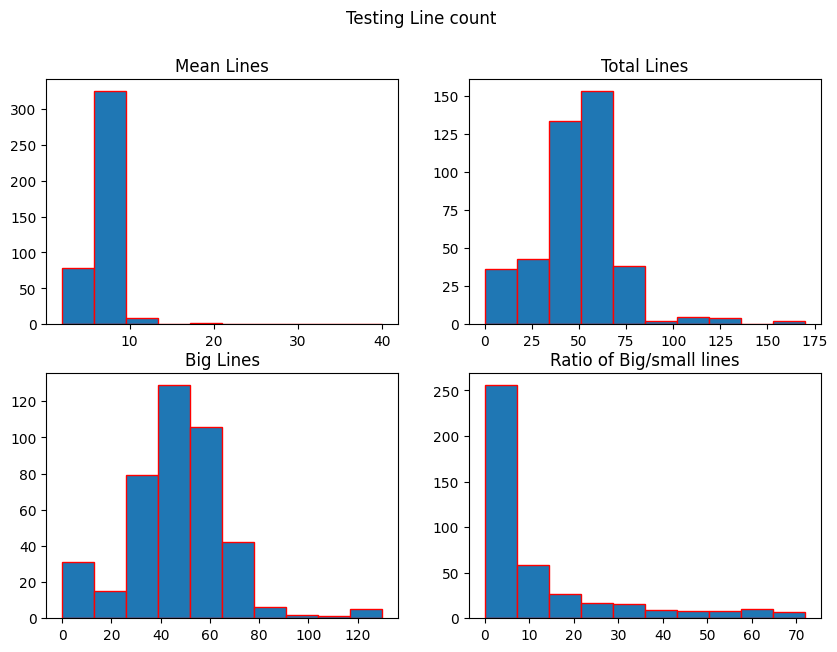

In [87]:
fig,axs = plt.subplots(2,2,figsize=(10,7))
fig.suptitle('Testing Line count')

axs[0,0].hist(df_clines['mean_lines'],edgecolor='red')
axs[0,0].set_title('Mean Lines')
axs[0,1].hist(df_clines['total_lines'],edgecolor='red')
axs[0,1].set_title('Total Lines')
axs[1,0].hist(df_clines['big_lines'],edgecolor='red')
axs[1,0].set_title('Big Lines')
axs[1,1].hist(df_clines['ratio_of_blsl'],edgecolor='red')
axs[1,1].set_title('Ratio of Big/small lines')


In [88]:
tokenizer = Tokenizer(filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~\t',char_level=False)
tokenizer.fit_on_texts([all_dua_songs_newline.Songs.iloc[1].replace('\n',' \n ')])
tokenizer.word_index

<>:1: DeprecationWarning: invalid escape sequence '\]'
<>:1: DeprecationWarning: invalid escape sequence '\]'
/var/folders/qm/2m60vf_d5z3b2hf93l6yznfr0000gn/T/ipykernel_10554/899575683.py:1: DeprecationWarning: invalid escape sequence '\]'
  tokenizer = Tokenizer(filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~\t',char_level=False)


{'\n': 1,
 'to': 2,
 'be': 3,
 'we': 4,
 'scared': 5,
 'lonely': 6,
 'were': 7,
 'the': 8,
 'holding': 9,
 'our': 10,
 'is': 11,
 'me': 12,
 'tonight': 13,
 'cause': 14,
 'and': 15,
 'for': 16,
 'it': 17,
 'on': 18,
 'all': 19,
 'just': 20,
 'only': 21,
 'reason': 22,
 'youre': 23,
 'ooh': 24,
 'wonder': 25,
 'keep': 26,
 'losing': 27,
 'somebody': 28,
 'better': 29,
 'why': 30,
 'bodies': 31,
 'are': 32,
 'both': 33,
 'minds': 34,
 'like': 35,
 'us': 36,
 'how': 37,
 'its': 38,
 'was': 39,
 'fights': 40,
 'slamming': 41,
 'doors': 42,
 'magnifying': 43,
 'flaws': 44,
 'i': 45,
 'what': 46,
 'coming': 47,
 'back': 48,
 'more': 49,
 'do': 50,
 'need': 51,
 'feel': 52,
 'alright': 53,
 'of': 54,
 'even': 55,
 'when': 56,
 'know': 57,
 'wrong': 58,
 'along': 59,
 'tell': 60,
 'can': 61,
 'eh': 62,
 'great': 63,
 'at': 64,
 'very': 65,
 'start': 66,
 'hands': 67,
 'each': 68,
 'other': 69,
 'couldnt': 70,
 'stand': 71,
 'far': 72,
 'apart': 73,
 'closer': 74,
 'now': 75,
 'picking': 76,
 '

In [89]:
list(all_dua_lyrics)

['Line_Lyrics', 'NumWords', 'Normalize_Lyrics']

In [90]:
lines=[]
for line in all_dua_lyrics["Line_Lyrics"]:
    print(line)
    token_list = tokenizer.texts_to_sequences([line])[0]
    print('--'*25)
    print(token_list)
    print('--'*25)

    for i in range(1, len(token_list)):
        n_gram_sequence = token_list[:i+1]
        print(n_gram_sequence)     

one one one one one
--------------------------------------------------
[]
--------------------------------------------------
talkin in my sleep at night makin myself crazy
--------------------------------------------------
[64]
--------------------------------------------------
wrote it down and read it out hopin it would save me
--------------------------------------------------
[17, 15, 17, 85, 17, 12]
--------------------------------------------------
[17, 15]
[17, 15, 17]
[17, 15, 17, 85]
[17, 15, 17, 85, 17]
[17, 15, 17, 85, 17, 12]
my love he makes me feel like nobody else nobody else
--------------------------------------------------
[12, 52, 35]
--------------------------------------------------
[12, 52]
[12, 52, 35]
but my love he doesnt love me so i tell myself i tell myself
--------------------------------------------------
[12, 45, 60, 45, 60]
--------------------------------------------------
[12, 45]
[12, 45, 60]
[12, 45, 60, 45]
[12, 45, 60, 45, 60]
one dont pick up the 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [94]:
# all_dua_songs_newline

In [95]:
def ngram(token_list):
    ng = []
    for i in range(1, len(token_list)):
        n_gram_sequence = token_list[:i+1]
        ng.append(n_gram_sequence)
    return ng

all_dua_songs = pd.read_csv("all_dua_songs.csv", index_col = 0)
all_dua_songs.iloc[[0]].Song_Lyrics.iloc[0]

'one one one one one talkin in my sleep at night makin myself crazy wrote it down and read it out hopin it would save me my love he makes me feel like nobody else nobody else but my love he doesnt love me so i tell myself i tell myself one dont pick up the phone you know hes only callin cause hes drunk and alone two dont let him in youll have to kick him out again three dont be his friend you know youre gonna wake up in his bed in the morning and if youre under him you aint gettin over him i got new rules i count em i got new rules i count em i gotta tell them to myself i got new rules i count em i gotta tell them to myself i keep pushin forwards but he keeps pullin me backwards now im standin back from it i finally see the pattern but my love he doesnt love me so i tell myself i tell myself i do i do i do one dont pick up the phone you know hes only callin cause hes drunk and alone two dont let him in youll have to kick him out again three dont be his friend you know youre gonna wake 

In [96]:
# all_dua_songs

In [97]:
from keras_preprocessing.sequence import pad_sequences

def seqform(data):
  
    tokenise = Tokenizer()
    input_sequences = []
    corpus = []
    k=0

    for i in range(0,len(df)):
        text = df.iloc[[i]].Song_Lyrics.iloc[0]
        if type(text)==float:
            pass
        else:
            text = text.lower().split("\n")
            text = [re.sub(r'\d+', '', i) for i in text]
            text = list(set(text))
        if text==' ':
            pass
        else:
            corpus.extend(text)
            k+=1
            
    tokenise.fit_on_texts(corpus)
    for line in corpus:
        token_list = tokenise.texts_to_sequences([line])[0]
        input_sequences.extend(ngram(token_list))


    max_sequence_len = max([len(x) for x in input_sequences])
    input_sequences = np.array(pad_sequences(input_sequences,
                       maxlen = max_sequence_len, padding='pre'))

    predictors, label = input_sequences[:,:-1],input_sequences[:,-1]
    fin_data = pd.DataFrame(np.hstack((predictors, label.reshape(-1,1))),columns=np.hstack((np.arange(1,predictors.shape[1]+1),np.array(['label']))))
    total_words = len(tokenise.word_index) + 1
    print('{} number of lyrics inputted'.format(k))

    return fin_data,tokenise,max_sequence_len,total_words,predictors,label

df = all_dua_songs
# df = all_dua_lyrics
fdf,tokenise,max_sequence_len,total_words,predictors,label = seqform(df)
print(fdf.shape,max_sequence_len,total_words)



408 number of lyrics inputted
(132219, 896) 896 4216


In [98]:
fdf.head(5)

,1,2,3,4,5,6,7,8,9,10,...,887,888,889,890,891,892,893,894,895,label
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,26,26
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,26,26,26
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,26,26,26,26
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,26,26,26,26,26
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,26,26,26,26,26,605


In [99]:
# Saving to 
fdf.to_csv('fin_df.csv',index=False)

In [100]:
print(fdf.shape)
print(fdf.values.max())

(132219, 896)
4215


In [101]:
dataX = [fdf.iloc[i,0:895].tolist() for i in range(0,fdf.shape[0])]
dataY = [fdf.iloc[i,895] for i in range(0,fdf.shape[0])]
print(len(dataX))
print(len(dataY))

132219
132219


In [102]:
# reshape X to be [samples, time steps, features]
X = np.reshape(dataX, (132219, 895, 1))

# one hot encode the output variable
y = np_utils.to_categorical(dataY)

In [103]:
len(y[0])

4216

In [104]:
print(predictors.shape)
print(label.shape)
print(X.shape,y.shape)
print(total_words,max_sequence_len)

(132219, 895)
(132219,)
(132219, 895, 1) (132219, 4216)
4216 896


In [105]:
model = Sequential()
model.add(Embedding(total_words, 150, input_length=max_sequence_len-1))
# Add an LSTM Layer
model.add(Bidirectional(LSTM(150, return_sequences=True)))  
# A dropout layer for regularisation
model.add(Dropout(0.2))
# Add another LSTM Layer
model.add(LSTM(100)) 
model.add(Dense(total_words/2, activation='relu'))  
# In the last layer, the shape should be equal to the total number of words present in our corpus
model.add(Dense(y.shape[1], activation='softmax'))
#model.add(Dense(total_words, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics='accuracy')  #(# Pick a loss function and an optimizer)
print(model.summary())

2022-12-13 09:50:28.989719: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 895, 150)          632400    
                                                                 
 bidirectional (Bidirectiona  (None, 895, 300)         361200    
 l)                                                              
                                                                 
 dropout (Dropout)           (None, 895, 300)          0         
                                                                 
 lstm_1 (LSTM)               (None, 100)               160400    
                                                                 
 dense (Dense)               (None, 2108)              212908    
                                                                 
 dense_1 (Dense)             (None, 4216)              8891544   
                                                        

In [106]:
# define the checkpoint
filepath="weights-improvement-{epoch:02d}-{loss:.4f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [checkpoint]

In [107]:
# model.fit(X,y, epochs= 60,callbacks=callbacks_list)

# Note : Commenting this as this took over 30 hours. Directly loading the fitted model. You can uncomment and run to verify. 

In [108]:
# # weights-improvement-02-1.4223.hdf5
# #37-4.9734
# filename = "weights-improvement-02-1.4223.hdf5"
# model.load_weights(filename)
# model.compile(loss='categorical_crossentropy', optimizer='adam',metrics='accuracy')
# model.fit(X, y, epochs=20, callbacks=callbacks_list)

# Note : Commenting this as this took over 30 hours. Directly loading the fitted model. You can uncomment and run to verify. 

In [109]:
# model.save_weights(Data_dir+'my_model_weights.h5')
# model.save(Data_dir+'my_model.h5')

# Note : Commenting this as this took over 30 hours. Directly loading the fitted model. You can uncomment and run to verify. 

In [110]:
# model.save(Data_dir + 'saved_model/my_model')
# Note : Commenting this as this took over 30 hours. Directly loading the fitted model. You can uncomment and run to verify. 

In [111]:

def make_lyrics(seed_text, next_words):
    pred_index=[]
    for i in range(next_words):
        token_list = tokenise.texts_to_sequences([seed_text])[0]
        token_list = pad_sequences([token_list],
                     maxlen=max_sequence_len-1,padding='pre')
        #print(token_list.shape)
        token_list = np.reshape(token_list, (1, max_sequence_len-1, 1))
        predicted = model.predict(token_list, verbose=0)
        predicted_index =  np.argmax(predicted)
        pred_index.append(predicted_index)
        


        #predicted_index=1
        output_word = ""
        for word, index in tokenise.word_index.items():
            if index == predicted_index:
                output_word = word
                break
        seed_text += " " + output_word
    print(seed_text)
    return seed_text


In [112]:

reverse_word_map = dict(map(reversed, tokenise.word_index.items()))
start = np.random.randint(0, len(dataX)-1)
pattern = dataX[start]
pattern_val = [i for i in pattern if i>0]
print("Seed:")
print(' '.join([reverse_word_map.get(value) for value in pattern_val]))
seed_text = [reverse_word_map.get(value)+' ' for value in pattern_val]
     


Seed:
i know it s hot i know weve got something that money can t buy fighting in fits biting your lip loving til late in the night tell me i m too crazy you can t tame me cant tame me tell me i have changed but i m the same me the same me inside hey if you don t like the way i talk then why am i on your mind if you don t like the way i rock then finish your glass of wine we fight and we argue youll still love me blind if we don t fuck this whole thing up guaranteed i can blow your mind mwah and tonight i m alive aint no dollar sign guaranteed i can blow your mind mwah and tonight i m alive aint no dollar sign guaranteed i can blow your mind mwah yeah im so bad best that you ve had i guess you re diggin the show open the door if you want some more when you wanna leave let


In [114]:
import pickle
import keras

Data_dir = "data"
# saving
# with open(Data_dir+'tokenizer.pickle', 'wb') as handle:
#     pickle.dump(tokenise, handle, protocol=pickle.HIGHEST_PROTOCOL)

# loading
with open(Data_dir + 'tokenizer.pickle', 'rb') as handle:
    tokenise = pickle.load(handle)
max_sequence_len = 896
model = keras.models.load_model(Data_dir + 'saved_model/my_model')

In [115]:
line1 = make_lyrics('Hey baby',100)


Hey baby turn it louder jealous a little louder lean though a word to sooth me id be apart closer now now now now now now now this current between us this flow this feeling tonight i know that youll still wanna see me on the sunday morning music real loud let me love you while the moon is still out something in you ou ou lit up heaven in me e e the feeling wont let me slee ee eep cause im lost in the way you move the way you feel one kiss is all it takes fallin in love


In [116]:
line2 = make_lyrics('My Love',10)


My Love isnt for sure i like falling of it talk but


In [117]:
line3 = make_lyrics('jealousy',80)


jealousy it mean yeah we dont know how it seems to sooth me id be apart out of these looking at this is all i want you to myself no i cant resist cause i wouldve stayed at home cause i i wouldve yeah i wouldve yeah i wouldve stayed at home cause i i wouldve yeah i wouldve yeah i wouldve stayed at home cause i i wouldve yeah i wouldve yeah i wouldve yeah i wouldve stayed at home


In [118]:
line4 = make_lyrics('Kill me',8)


Kill me slowly with me lo we at each other


In [119]:
line5 = make_lyrics('Why god',5)


Why god what youre diggin the flashing


In [120]:
from keras_preprocessing.sequence import pad_sequences
import numpy as np
line1 = make_lyrics('Hey baby',100)


Hey baby turn it louder jealous a little louder lean though a word to sooth me id be apart closer now now now now now now now this current between us this flow this feeling tonight i know that youll still wanna see me on the sunday morning music real loud let me love you while the moon is still out something in you ou ou lit up heaven in me e e the feeling wont let me slee ee eep cause im lost in the way you move the way you feel one kiss is all it takes fallin in love
